# **Data Cleaning**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk

In [2]:
df = pd.read_csv("/content/drive/MyDrive/Apex_Legends_Steam_Reviews.csv")
df.tail()

,id,language,review,created,voted_up,votes_up,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
71310,129545870,english,stupid game :),2022-12-28 21:31:31,False,1,0,False,False,False,42,1,41030,731,9818,2024-01-31 20:48:34
71311,129545713,english,its free,2022-12-28 21:29:21,True,0,0,False,False,False,0,11,1164,0,735,2023-01-15 02:06:16
71312,129544748,english,good times,2022-12-28 21:15:23,True,0,0,False,False,False,0,5,33148,0,18922,2023-10-29 19:36:30
71313,129544646,english,They ruined this game a long time ago.,2022-12-28 21:13:37,False,1,0,False,False,False,73,30,817,0,815,2023-11-22 01:50:57
71314,129543409,english,it gud for pew pew,2022-12-28 20:56:10,True,1,0,False,True,False,0,4,36912,0,23258,2023-12-09 01:24:07


In [3]:
#remove special characters from reviews
df["review"] = df["review"].str.replace(r'[^a-zA-Z0-9\s]', '', regex=True)

# Fill NaN values with empty strings before applying sentiment analysis
if df["review"].isnull().any():
    df.fillna({"review":""}, inplace=True)

In [4]:
from datetime import datetime

In [5]:
df["created"] = pd.to_datetime(df["created"]).dt.normalize()
df.tail()

,id,language,review,created,voted_up,votes_up,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
71310,129545870,english,stupid game,2022-12-28,False,1,0,False,False,False,42,1,41030,731,9818,2024-01-31 20:48:34
71311,129545713,english,its free,2022-12-28,True,0,0,False,False,False,0,11,1164,0,735,2023-01-15 02:06:16
71312,129544748,english,good times,2022-12-28,True,0,0,False,False,False,0,5,33148,0,18922,2023-10-29 19:36:30
71313,129544646,english,They ruined this game a long time ago,2022-12-28,False,1,0,False,False,False,73,30,817,0,815,2023-11-22 01:50:57
71314,129543409,english,it gud for pew pew,2022-12-28,True,1,0,False,True,False,0,4,36912,0,23258,2023-12-09 01:24:07


In [6]:
#Split Data Into Seasons
seasons = {
    "Preseason": (datetime(2019, 2, 4),   datetime(2019, 3, 19)),
    "Season 1": (datetime(2019, 3, 19), datetime(2019, 6, 18)),
    "Season 2": (datetime(2019, 7, 2), datetime(2019, 10, 1)),
    "Season 3": (datetime(2019, 10, 1), datetime(2020, 2, 4)),
    "Season 4": (datetime(2020, 2, 4), datetime(2020, 5, 12)),
    "Season 5": (datetime(2020, 5, 12), datetime(2020, 8, 18)),
    "Season 6": (datetime(2020, 8, 18), datetime(2020, 11, 4)),
    "Season 7": (datetime(2020, 11, 4), datetime(2021, 2, 2)),
    "Season 8": (datetime(2021, 2, 2), datetime(2021, 5, 4)),
    "Season 9": (datetime(2021, 5, 4), datetime(2021, 8, 3)),
    "Season 10": (datetime(2021, 8, 3), datetime(2021, 11, 2)),
    "Season 11": (datetime(2021, 11, 2), datetime(2022, 2, 8)),
    "Season 12": (datetime(2022, 2, 8), datetime(2022, 5, 10)),
    "Season 13": (datetime(2022, 5, 10), datetime(2022, 8, 9)),
    "Season 14": (datetime(2022, 8, 9), datetime(2022, 11, 1)),
    "Season 15": (datetime(2022, 11, 1), datetime(2023, 2, 14)),
    "Season 16": (datetime(2023, 2, 14), datetime(2023, 5, 9)),
    "Season 17": (datetime(2023, 5, 9), datetime(2023, 8, 8)),
    "Season 18": (datetime(2023, 8, 8), datetime(2023, 10, 31)),
    "Season 19": (datetime(2023, 10, 31), datetime(2024, 2, 13)),
    "Season 20": (datetime(2024, 2, 13), datetime(2024, 5, 6)),
    "Season 21": (datetime(2024, 5, 7), datetime(2024, 8, 6)),
    "Season 22": (datetime(2024, 8, 6), datetime(2024, 11, 5)),
    "Season 23": (datetime(2024, 11, 5), datetime(2025, 2, 11)),
    "Season 24": (datetime(2025, 2, 11), datetime(2025, 5, 6)),
    "Season 25": (datetime(2025, 5, 6), datetime(2025, 7, 5)),  # approximate end date :contentReference[oaicite:1]{index=1}
}

<Axes: title={'center': 'Votes Up or Down'}, xlabel='voted_up'>

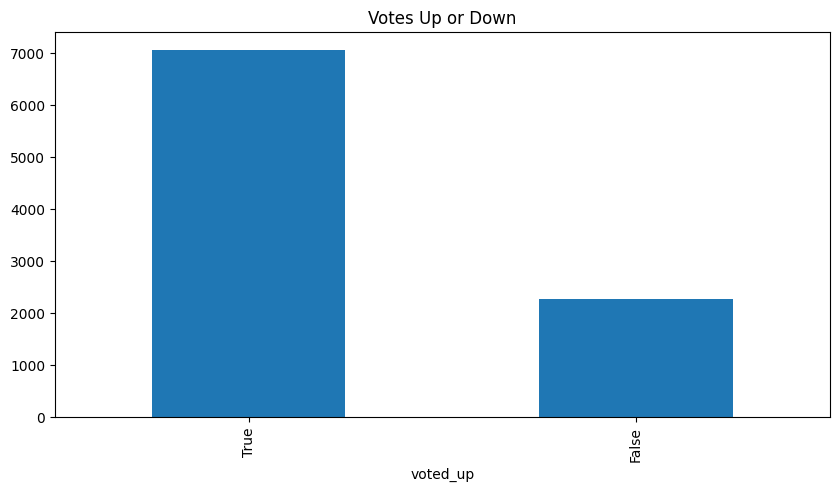

In [7]:
#Data Starts at Season 15
start, end = seasons["Season 15"]
s15_mask = (df['created'] >= start) & (df['created'] <= end)
df_s15 = df.loc[s15_mask]
df_s15["voted_up"].value_counts().plot(kind= "bar",
          title = "Votes Up or Down",
          figsize = (10,5))

<Axes: title={'center': 'Votes Up or Down'}, xlabel='voted_up'>

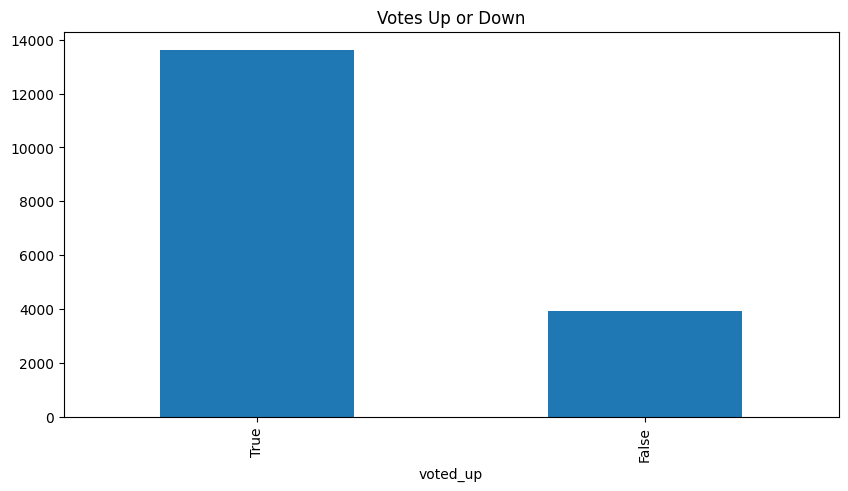

In [8]:
start, end = seasons["Season 16"]
s16_mask = (df['created'] >= start) & (df['created'] <= end)
df_s16 = df.loc[s16_mask]
df_s16.tail()
df_s16["voted_up"].value_counts().plot(kind= "bar",
          title = "Votes Up or Down",
          figsize = (10,5))

<Axes: title={'center': 'Votes Up or Down'}, xlabel='voted_up'>

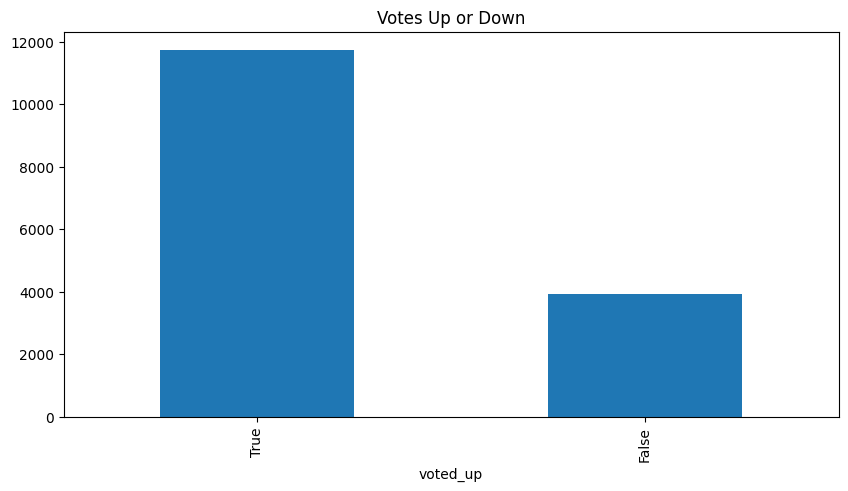

In [9]:
start, end = seasons["Season 17"]
s17_mask = (df['created'] >= start) & (df['created'] <= end)
df_s17 = df.loc[s17_mask]
df_s17.tail()
df_s17["voted_up"].value_counts().plot(kind= "bar",
          title = "Votes Up or Down",
          figsize = (10,5))

<Axes: title={'center': 'Votes Up or Down'}, xlabel='voted_up'>

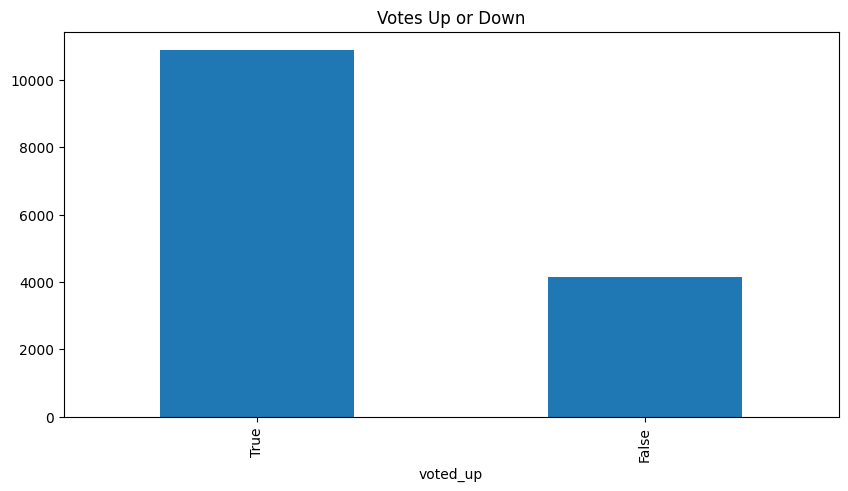

In [10]:
start, end = seasons["Season 18"]
s18_mask = (df['created'] >= start) & (df['created'] <= end)
df_s18 = df.loc[s18_mask]
df_s18.tail()
df_s18["voted_up"].value_counts().plot(kind= "bar",
          title = "Votes Up or Down",
          figsize = (10,5))

<Axes: title={'center': 'Votes Up or Down'}, xlabel='voted_up'>

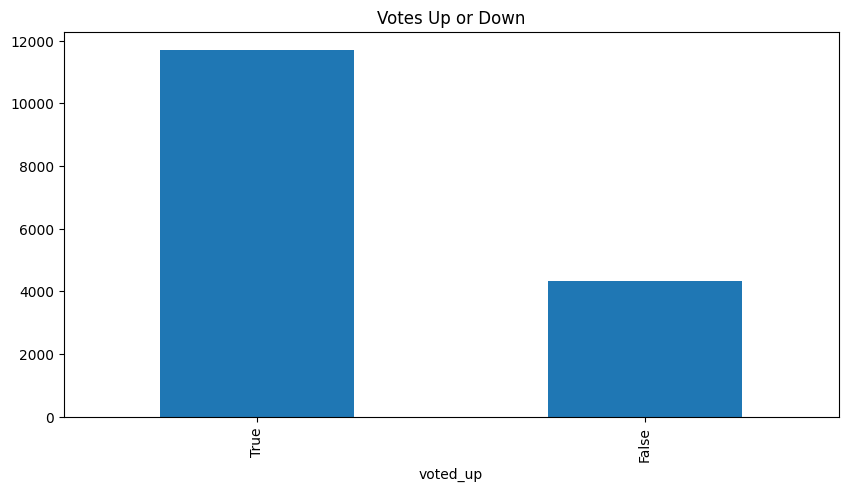

In [11]:
start, end = seasons["Season 19"]
s19_mask = (df['created'] >= start) & (df['created'] <= end)
df_s19 = df.loc[s19_mask]
df_s19.head()
#Data Ends at Season 19
df_s19["voted_up"].value_counts().plot(kind= "bar",
          title = "Votes Up or Down",
          figsize = (10,5))

# VADER Model (Valence Aware Dictionary and Sentiment Reasoner)


In [12]:
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [13]:
#Get function
sia = SentimentIntensityAnalyzer()
#Test
sia.polarity_scores("I hate this game")

{'neg': 0.649, 'neu': 0.351, 'pos': 0.0, 'compound': -0.5719}

In [14]:
sia.polarity_scores("I love this game")

{'neg': 0.0, 'neu': 0.323, 'pos': 0.677, 'compound': 0.6369}

In [15]:
s15_score = {}
for i, row in df_s15.iterrows():
  review = row["review"]
  id = row["id"]
  s15_score[id] = sia.polarity_scores(review)

vaders_s15 = pd.DataFrame(s15_score).T
vaders_s15 = vaders_s15.reset_index().rename(columns={"index":"id"})
vaders_s15 = vaders_s15.merge(df, on="id")
vaders_s15

,id,neg,neu,pos,compound,language,review,created,voted_up,votes_up,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
0,132862276,0.000,0.000,0.000,0.0000,english,g,2023-02-14,True,0,0,False,False,False,21,2,37562,1232,1925,2024-02-01 21:04:04
1,132862220,0.000,0.537,0.463,0.9443,english,Can be highly competitive or casual with multi...,2023-02-14,True,0,0,False,False,False,0,1,15951,0,4298,2023-07-14 23:38:25
2,132862134,0.000,0.250,0.750,0.8402,english,Awesome game have a blast playing w friends,2023-02-14,True,0,0,False,True,False,0,5,14937,473,7636,2024-01-21 22:55:02
3,132862133,0.000,1.000,0.000,0.0000,english,but takes to much space\n,2023-02-14,True,0,0,False,False,False,0,1,2584,0,2584,2023-02-13 01:28:05
4,132861925,0.000,0.263,0.737,0.4215,english,trash lol,2023-02-14,False,0,0,False,False,False,0,9,953,0,754,2023-02-16 00:10:48
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9312,129545870,0.773,0.227,0.000,-0.5267,english,stupid game,2022-12-28,False,1,0,False,False,False,42,1,41030,731,9818,2024-01-31 20:48:34
9313,129545713,0.000,0.233,0.767,0.5106,english,its free,2022-12-28,True,0,0,False,False,False,0,11,1164,0,735,2023-01-15 02:06:16
9314,129544748,0.000,0.256,0.744,0.4404,english,good times,2022-12-28,True,0,0,False,False,False,0,5,33148,0,18922,2023-10-29 19:36:30
9315,129544646,0.341,0.659,0.000,-0.4767,english,They ruined this game a long time ago,2022-12-28,False,1,0,False,False,False,73,30,817,0,815,2023-11-22 01:50:57


In [16]:
s16_score = {}
for i, row in df_s16.iterrows():
  review = row["review"]
  id = row["id"]
  s16_score[id] = sia.polarity_scores(review)

vaders_s16 = pd.DataFrame(s16_score).T
vaders_s16 = vaders_s16.reset_index().rename(columns={"index":"id"})
vaders_s16 = vaders_s16.merge(df, on="id")

In [17]:
s17_score = {}
for i, row in df_s17.iterrows():
  review = row["review"]
  id = row["id"]
  s17_score[id] = sia.polarity_scores(review)

vaders_s17 = pd.DataFrame(s17_score).T
vaders_s17 = vaders_s17.reset_index().rename(columns={"index":"id"})
vaders_s17 = vaders_s17.merge(df, on="id")

In [18]:
s18_score = {}
for i, row in df_s18.iterrows():
  review = row["review"]
  id = row["id"]
  s18_score[id] = sia.polarity_scores(review)

vaders_s18 = pd.DataFrame(s18_score).T
vaders_s18 = vaders_s18.reset_index().rename(columns={"index":"id"})
vaders_s18 = vaders_s18.merge(df, on="id")

In [19]:
s19_score = {}
for i, row in df_s19.iterrows():
  review = row["review"]
  id = row["id"]
  s19_score[id] = sia.polarity_scores(review)

vaders_s19 = pd.DataFrame(s19_score).T
vaders_s19 = vaders_s19.reset_index().rename(columns={"index":"id"})
vaders_s19 = vaders_s19.merge(df, on="id")

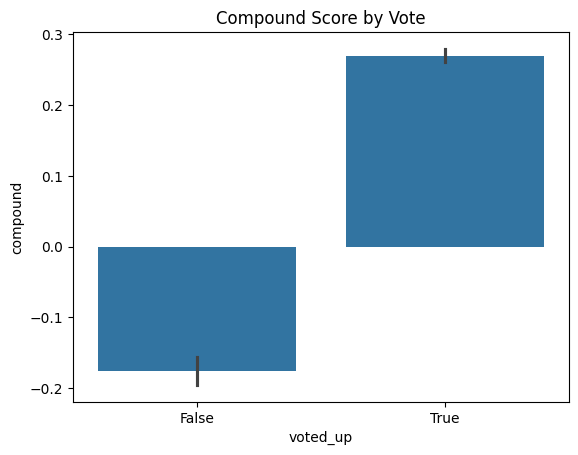

In [20]:
s15_plot = sns.barplot(data = vaders_s15, x = "voted_up", y = "compound")
s15_plot.set_title("Compound Score by Vote")
plt.show()


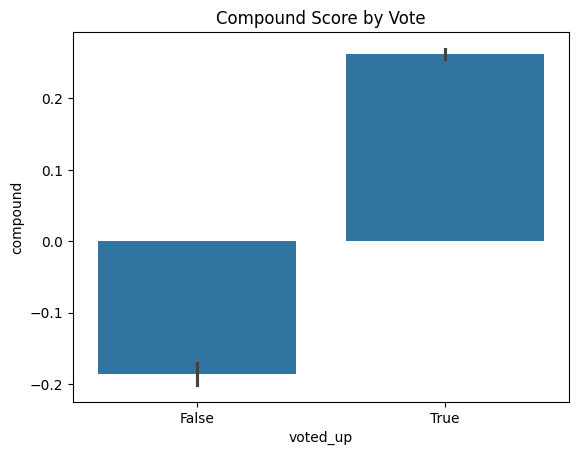

In [21]:
s16_plot = sns.barplot(data = vaders_s16, x = "voted_up", y = "compound")
s16_plot.set_title("Compound Score by Vote")
plt.show()


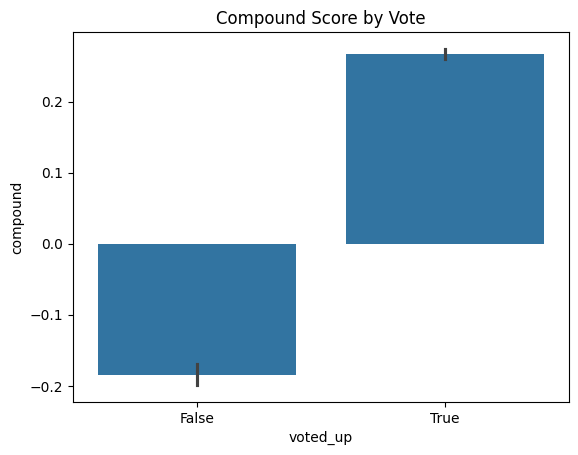

In [22]:
s17_plot = sns.barplot(data = vaders_s17, x = "voted_up", y = "compound")
s17_plot.set_title("Compound Score by Vote")
plt.show()


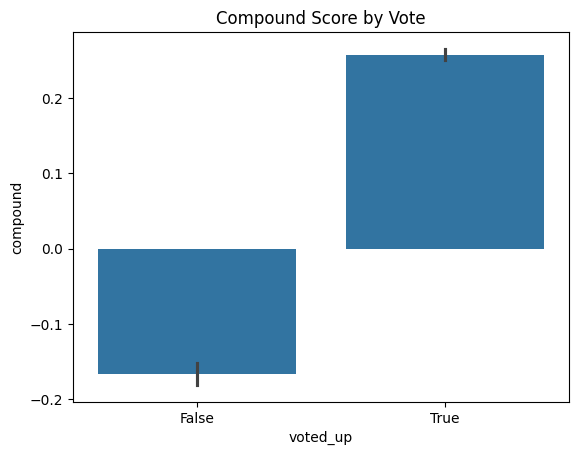

In [23]:
s18_plot = sns.barplot(data = vaders_s18, x = "voted_up", y = "compound")
s18_plot.set_title("Compound Score by Vote")
plt.show()

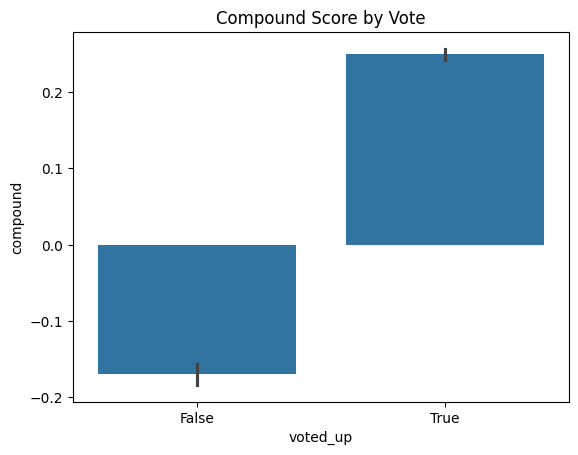

In [24]:
s19_plot = sns.barplot(data = vaders_s19, x = "voted_up", y = "compound")
s19_plot.set_title("Compound Score by Vote")
plt.show()

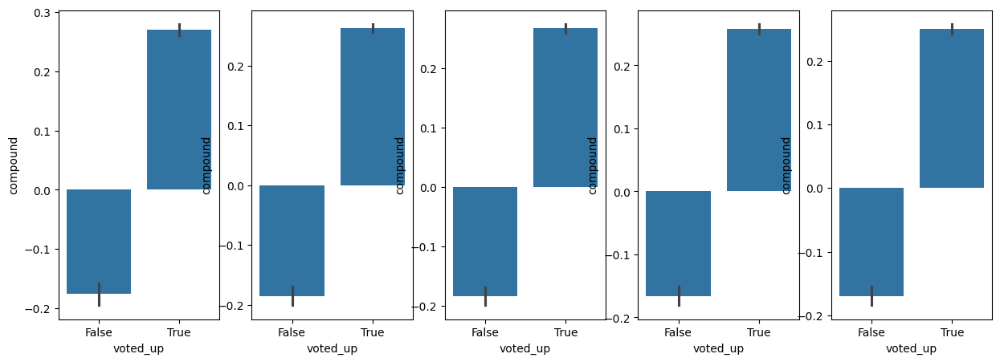

In [25]:
fig,axs = plt.subplots(1,5, figsize = (15, 5))
sns.barplot(data = vaders_s15, x = "voted_up", y = "compound", ax =axs[0])
sns.barplot(data = vaders_s16, x = "voted_up", y = "compound", ax =axs[1])
sns.barplot(data = vaders_s17, x = "voted_up", y = "compound", ax =axs[2])
sns.barplot(data = vaders_s18, x = "voted_up", y = "compound", ax =axs[3])
sns.barplot(data = vaders_s19, x = "voted_up", y = "compound", ax =axs[4])
plt.show()

# Roberta Model

In [26]:
from transformers import AutoTokenizer
from transformers import AutoModelForSequenceClassification
from scipy.special import softmax

In [27]:
MODEL = f"cardiffnlp/twitter-roberta-base-sentiment"
tokenizer = AutoTokenizer.from_pretrained(MODEL)
model = AutoModelForSequenceClassification.from_pretrained(MODEL)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/747 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/150 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/499M [00:00<?, ?B/s]

In [28]:
def polarity_scores_roberta(example_text):
  encoded_text = tokenizer(example_text, return_tensors = "pt")
  output = model(**encoded_text)
  scores = output[0][0].detach().numpy()
  scores = softmax(scores)
  scores_dict = {
      "roberta_neg": scores[0],
      "roberta_neu": scores[1],
      "roberta_pos": scores[2]
  }
  return scores_dict
polarity_scores_roberta("I hate this game")

{'roberta_neg': np.float32(0.9781382),
 'roberta_neu': np.float32(0.017138258),
 'roberta_pos': np.float32(0.0047236243)}

In [29]:
s15_results = {}
for i, row in df_s15.iterrows():
  try:
    review = row["review"]
    id = row["id"]
    s15_vader_result = sia.polarity_scores(review)
    s15_vader_result_rename = {}
    for key, value in s15_vader_result.items():
      s15_vader_result_rename[f"vader_{key}"] = value
    s15_roberta_result = polarity_scores_roberta(review)
    both = {**s15_vader_result_rename, **s15_roberta_result}
    s15_results[id] = both
  except RuntimeError:
    print(f"Broke for id {id}")

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Broke for id 132587916
Broke for id 131546457
Broke for id 131483392
Broke for id 131389080
Broke for id 131385098
Broke for id 131301641
Broke for id 131273786
Broke for id 131057786
Broke for id 130543499
Broke for id 130543056
Broke for id 130537943
Broke for id 130263916
Broke for id 130182357
Broke for id 130050920
Broke for id 129969114
Broke for id 129920299
Broke for id 129860813
Broke for id 129846403
Broke for id 129660627


In [30]:
from tqdm.notebook import tqdm

In [31]:
total_score_s15 = pd.DataFrame(s15_results).T
total_score_s15 = total_score_s15.reset_index().rename(columns={"index":"id"})
total_score_s15 = total_score_s15.merge(df_s15, on="id")
total_score_s15.tail()

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,language,review,...,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
9293,129545870,0.773,0.227,0.000,-0.5267,0.920544,0.066613,0.012843,english,stupid game,...,0,False,False,False,42,1,41030,731,9818,2024-01-31 20:48:34
9294,129545713,0.000,0.233,0.767,0.5106,0.064371,0.524171,0.411458,english,its free,...,0,False,False,False,0,11,1164,0,735,2023-01-15 02:06:16
9295,129544748,0.000,0.256,0.744,0.4404,0.015346,0.157625,0.827029,english,good times,...,0,False,False,False,0,5,33148,0,18922,2023-10-29 19:36:30
9296,129544646,0.341,0.659,0.000,-0.4767,0.971662,0.025542,0.002796,english,They ruined this game a long time ago,...,0,False,False,False,73,30,817,0,815,2023-11-22 01:50:57
9297,129543409,0.000,1.000,0.000,0.0000,0.014053,0.446566,0.539381,english,it gud for pew pew,...,0,False,True,False,0,4,36912,0,23258,2023-12-09 01:24:07


In [38]:
s16_results = {}
for i, row in df_s16.iterrows():
    try:
        review = row["review"]
        id = row["id"]

        # Handle missing or invalid values
        if not isinstance(review, str) or not review.strip():
            review = ""

        # Vader
        s16_vader_result = sia.polarity_scores(review)
        s16_vader_result_rename = {f"vader_{k}": v for k, v in s16_vader_result.items()}

        if review:  # Only run RoBERTa if text is valid
            try:
                # Truncate long reviews to prevent index errors
                review_trunc = review[:512]
                s16_roberta_result = polarity_scores_roberta(review_trunc)
                both = {**s16_vader_result_rename, **s16_roberta_result}
                s16_results[id] = both
            except IndexError:
                print(f"Index error for id {id}, storing only VADER result")
                s16_results[id] = s16_vader_result_rename
        else:
            s16_results[id] = s16_vader_result_rename

    except RuntimeError:
        print(f"Broke for id {id}")

In [39]:
total_score_s16 = pd.DataFrame(s16_results).T
total_score_s16 = total_score_s16.reset_index().rename(columns={"index":"id"})
total_score_s16 = total_score_s16.merge(df_s16, on="id")
total_score_s16.tail()

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,language,review,...,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
17527,132801630,0.000,0.000,1.000,0.5106,0.036648,0.381753,0.581599,english,fun,...,0,False,False,False,0,2,24232,0,11480,2024-01-06 03:07:11
17528,132801589,0.000,1.000,0.000,0.0000,0.198362,0.616558,0.185081,english,310,...,0,False,False,False,0,56,97,0,97,2022-08-20 15:40:46
17529,132801500,0.082,0.779,0.140,0.4173,0.004184,0.017503,0.978313,english,I am a returning veteran from season 1 and thi...,...,0,False,True,False,0,2,4522,0,1898,2023-11-13 17:19:53
17530,132801429,0.000,0.256,0.744,0.4404,0.008486,0.064623,0.926890,english,good game,...,0,False,True,False,0,3,19885,70,2737,2024-01-31 22:39:35
17531,132800927,0.000,0.795,0.205,0.2023,0.536678,0.429362,0.033960,english,recommended for those ppl who dont have life,...,0,False,True,False,0,1,12877,0,10835,2023-04-22 13:02:34


In [32]:
s17_results = {}
for i, row in df_s17.iterrows():
  try:
    review = row["review"]
    id = row["id"]
    s17_vader_result = sia.polarity_scores(review)
    s17_vader_result_rename = {}
    for key, value in s17_vader_result.items():
      s17_vader_result_rename[f"vader_{key}"] = value
    if review: # Check if review is not empty
      s17_roberta_result = polarity_scores_roberta(review)
      both = {**s17_vader_result_rename, **s17_roberta_result}
      s17_results[id] = both
    else:
      s17_results[id] = s17_vader_result_rename
  except RuntimeError:
    print(f"Broke for id {id}")

Broke for id 143625496
Broke for id 143619241
Broke for id 143616790
Broke for id 143611612
Broke for id 143462467
Broke for id 142775903
Broke for id 142475047
Broke for id 142442937
Broke for id 142428427
Broke for id 142138842
Broke for id 141845183
Broke for id 141781323
Broke for id 141638580
Broke for id 141520674
Broke for id 141344478
Broke for id 141038673
Broke for id 140886839
Broke for id 140853794
Broke for id 140753005
Broke for id 140465719
Broke for id 140254499
Broke for id 140148817
Broke for id 140013967
Broke for id 139872714
Broke for id 139837666
Broke for id 139701942
Broke for id 139645823
Broke for id 139625785
Broke for id 139605133
Broke for id 139594496
Broke for id 139251870
Broke for id 139242464
Broke for id 139184907
Broke for id 139170038
Broke for id 138938169
Broke for id 138884894
Broke for id 138813702
Broke for id 138770351
Broke for id 138395047
Broke for id 138358273
Broke for id 138346705
Broke for id 138305139
Broke for id 138227524
Broke for i

In [34]:
total_score_s17 = pd.DataFrame(s17_results).T
total_score_s17 = total_score_s17.reset_index().rename(columns={"index":"id"})
total_score_s17 = total_score_s17.merge(df_s17, on="id")
total_score_s17.tail()

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,language,review,...,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
15597,138021428,0.000,0.000,1.000,0.4019,0.150012,0.442195,0.407793,english,yes\n,...,0,False,False,False,0,3,10687,0,8044,2023-12-03 04:08:12
15598,138020853,0.073,0.508,0.419,0.9933,0.014704,0.040544,0.944752,english,very good because like im decent at the game y...,...,0,False,False,False,56,2,18739,15,14572,2024-01-26 03:51:46
15599,138020508,0.000,0.000,1.000,0.4019,0.138576,0.441277,0.420147,english,yes,...,0,False,False,False,38,22,1166,0,249,2023-07-28 00:31:54
15600,138020285,0.196,0.491,0.312,0.3919,0.707376,0.256202,0.036422,english,u get raped by predators in bronze matches but...,...,0,False,False,False,0,1,72703,8,65201,2024-01-30 01:40:27
15601,138020060,0.272,0.728,0.000,-0.2183,0.613742,0.282784,0.103473,english,Game just makes me so hard \n,...,0,False,False,False,0,1,183457,0,71789,2023-12-03 14:51:46


In [35]:
s18_results = {}
for i, row in df_s18.iterrows():
    try:
        review = row["review"]
        id = row["id"]

        # Handle missing or invalid values
        if not isinstance(review, str) or not review.strip():
            review = ""

        # Vader
        s18_vader_result = sia.polarity_scores(review)
        s18_vader_result_rename = {f"vader_{k}": v for k, v in s18_vader_result.items()}

        if review:  # Only run RoBERTa if text is valid
            try:
                # Truncate long reviews to prevent index errors
                review_trunc = review[:512]
                s18_roberta_result = polarity_scores_roberta(review_trunc)
                both = {**s18_vader_result_rename, **s18_roberta_result}
                s18_results[id] = both
            except IndexError:
                print(f"Index error for id {id}, storing only VADER result")
                s18_results[id] = s18_vader_result_rename
        else:
            s18_results[id] = s18_vader_result_rename

    except RuntimeError:
        print(f"Broke for id {id}")

In [36]:
total_score_s18 = pd.DataFrame(s18_results).T
total_score_s18 = total_score_s18.reset_index().rename(columns={"index":"id"})
total_score_s18 = total_score_s18.merge(df_s18, on="id")
total_score_s18.tail()

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,language,review,...,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
15049,143617567,0.000,1.000,0.000,0.0000,0.174636,0.530162,0.295202,english,would game,...,0,False,False,False,144,12,6188,0,4767,2023-10-26 19:32:18
15050,143617553,0.000,0.786,0.214,0.5994,0.936227,0.057228,0.006546,english,if you like getting third partied every fuckin...,...,0,False,False,False,0,7,8028,0,3922,2024-01-09 18:04:56
15051,143616790,0.031,0.744,0.226,0.9987,0.000952,0.014544,0.984504,english,Apex Legends has finally made its longawaited ...,...,0,False,False,False,107,9,133468,5561,91674,2024-01-31 00:01:09
15052,143616758,0.000,0.707,0.293,0.6597,0.108746,0.375002,0.516253,english,enjoyable although getting any other legends r...,...,0,False,False,False,0,3,2414,0,1979,2024-01-15 21:37:16
15053,143616442,0.000,1.000,0.000,0.0000,0.237503,0.512793,0.249704,english,pk,...,0,False,False,False,0,1,24933,258,17686,2024-01-28 22:52:46


In [40]:
s19_results = {}
for i, row in df_s19.iterrows():
    try:
        review = row["review"]
        id = row["id"]

        # Handle missing or invalid values
        if not isinstance(review, str) or not review.strip():
            review = ""

        # Vader
        s19_vader_result = sia.polarity_scores(review)
        s19_vader_result_rename = {f"vader_{k}": v for k, v in s19_vader_result.items()}

        if review:  # Only run RoBERTa if text is valid
            try:
                # Truncate long reviews to prevent index errors
                review_trunc = review[:512]
                s19_roberta_result = polarity_scores_roberta(review_trunc)
                both = {**s19_vader_result_rename, **s19_roberta_result}
                s19_results[id] = both
            except IndexError:
                print(f"Index error for id {id}, storing only VADER result")
                s19_results[id] = s19_vader_result_rename
        else:
            s19_results[id] = s19_vader_result_rename

    except RuntimeError:
        print(f"Broke for id {id}")

In [41]:
total_score_s19 = pd.DataFrame(s19_results).T
total_score_s19 = total_score_s19.reset_index().rename(columns={"index":"id"})
total_score_s19 = total_score_s19.merge(df_s19, on="id")
total_score_s19.tail()

,id,vader_neg,vader_neu,vader_pos,vader_compound,roberta_neg,roberta_neu,roberta_pos,language,review,...,comment_count,steam_purchase,recieved_for_free,written_during_early_access,author_num_games_owned,author_num_reviews,author_playtime_forever,author_playtime_last_two_weeks,author_playtime_at_review,author_last_played
16011,149222880,0.000,1.000,0.000,0.0000,0.023820,0.265910,0.710270,english,it effoc and it funi,...,0,False,False,False,0,1,1220,0,1220,2022-04-09 09:48:28
16012,149222619,0.404,0.596,0.000,-0.2584,0.218693,0.645248,0.136060,english,Stay sane dont play,...,0,False,False,False,42,3,156338,0,156338,2023-10-09 00:49:00
16013,149222551,0.017,0.815,0.168,0.9289,0.662017,0.271472,0.066511,english,i cant even play this game it keeps crashing o...,...,0,False,False,False,0,2,11930,1049,7415,2024-01-29 05:54:25
16014,149222534,0.000,1.000,0.000,0.0000,0.673070,0.286145,0.040785,english,oldie and not goody,...,0,False,False,False,68,1,21280,1,20390,2024-01-29 00:09:45
16015,149221509,0.000,1.000,0.000,0.0000,0.231326,0.613473,0.155202,english,Penis,...,0,False,True,False,48,3,3292,0,2323,2024-01-14 03:51:21


In [70]:
total_score_s15.to_csv("total_score_s15.csv")
total_score_s16.to_csv("total_score_s16.csv")
total_score_s17.to_csv("total_score_s17.csv")
total_score_s18.to_csv("total_score_s18.csv")
total_score_s19.to_csv("total_score_s19.csv")

# Comparing Model Results

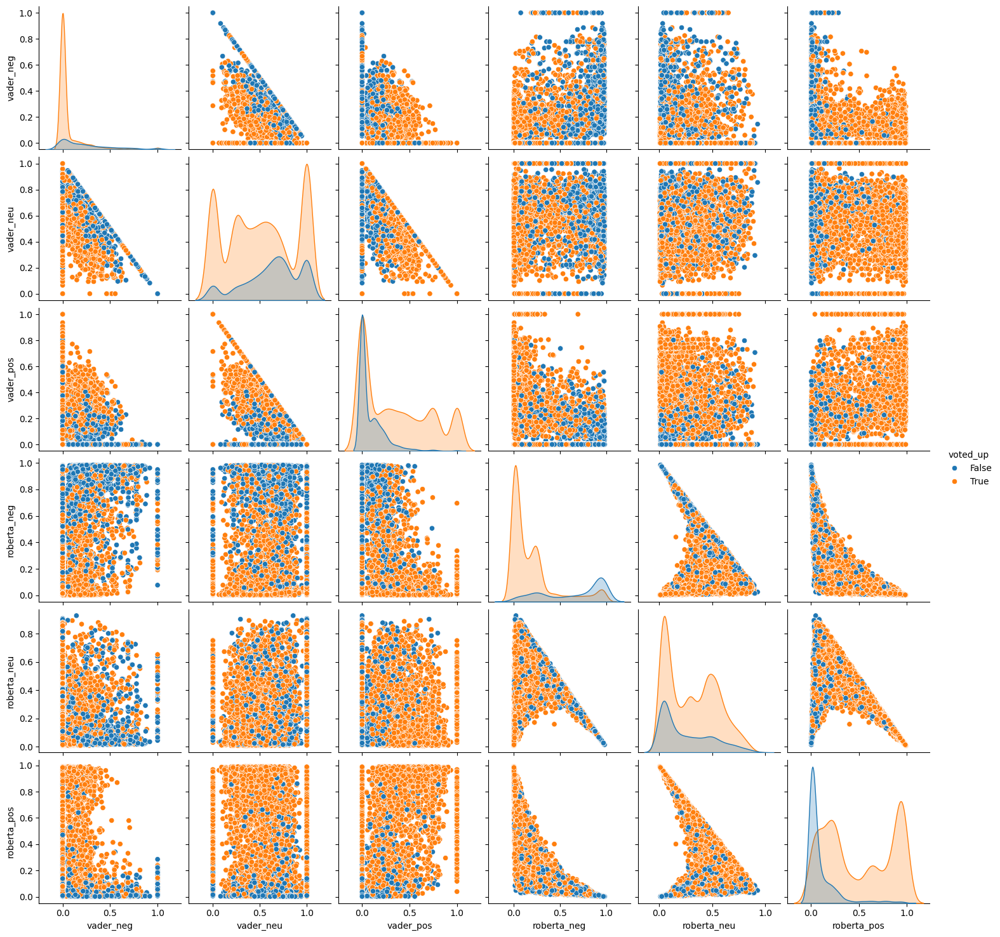

In [42]:
sns.pairplot(data = total_score_s15, vars = ['vader_neg','vader_neu','vader_pos',
                                            'roberta_neg','roberta_neu','roberta_pos'],
             hue = "voted_up", palette = "tab10")
plt.show()


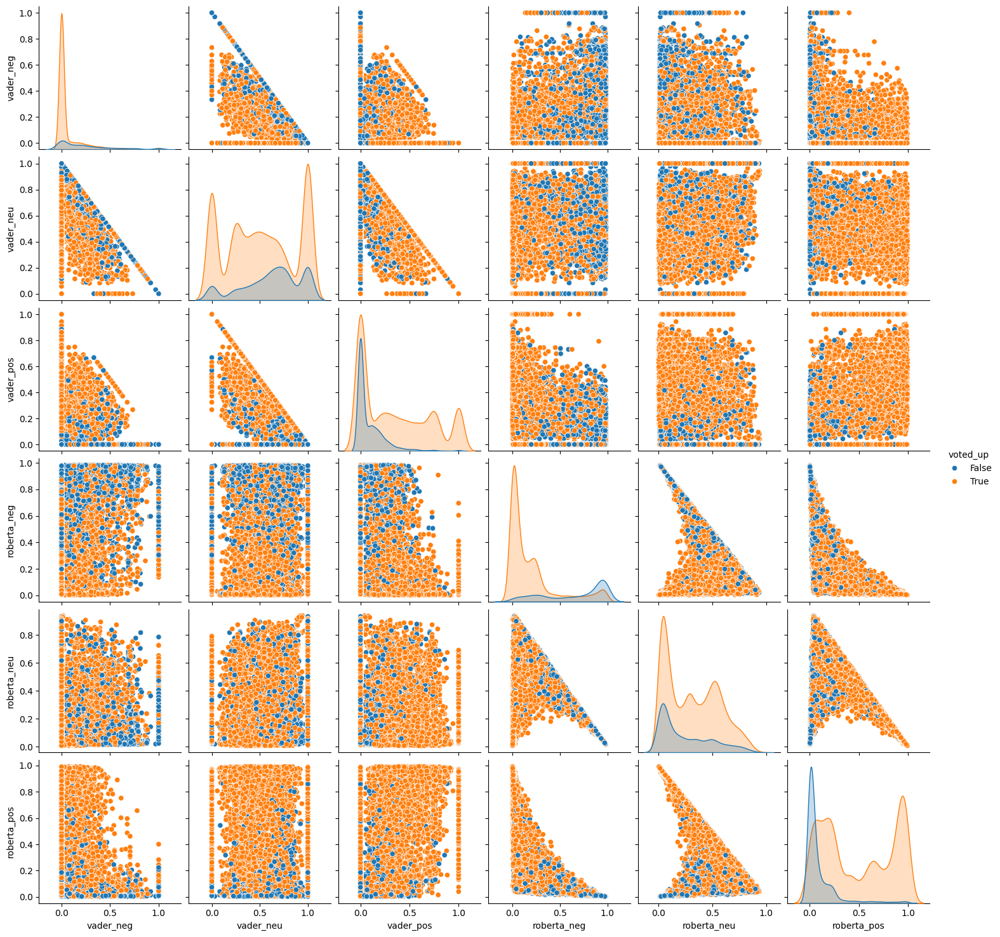

In [43]:
sns.pairplot(data = total_score_s16, vars = ['vader_neg','vader_neu','vader_pos',
                                            'roberta_neg','roberta_neu','roberta_pos'],
             hue = "voted_up", palette = "tab10")
plt.show()


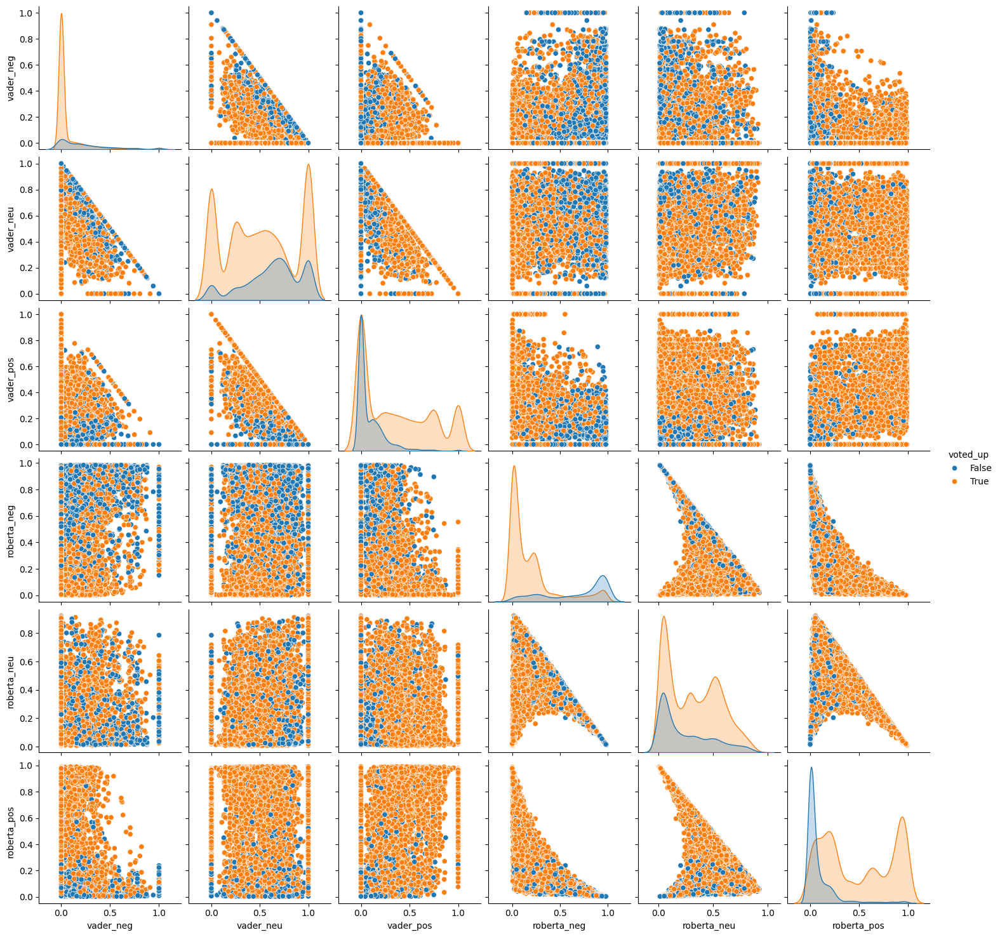

In [44]:
sns.pairplot(data = total_score_s17, vars = ['vader_neg','vader_neu','vader_pos',
                                            'roberta_neg','roberta_neu','roberta_pos'],
             hue = "voted_up", palette = "tab10")
plt.show()


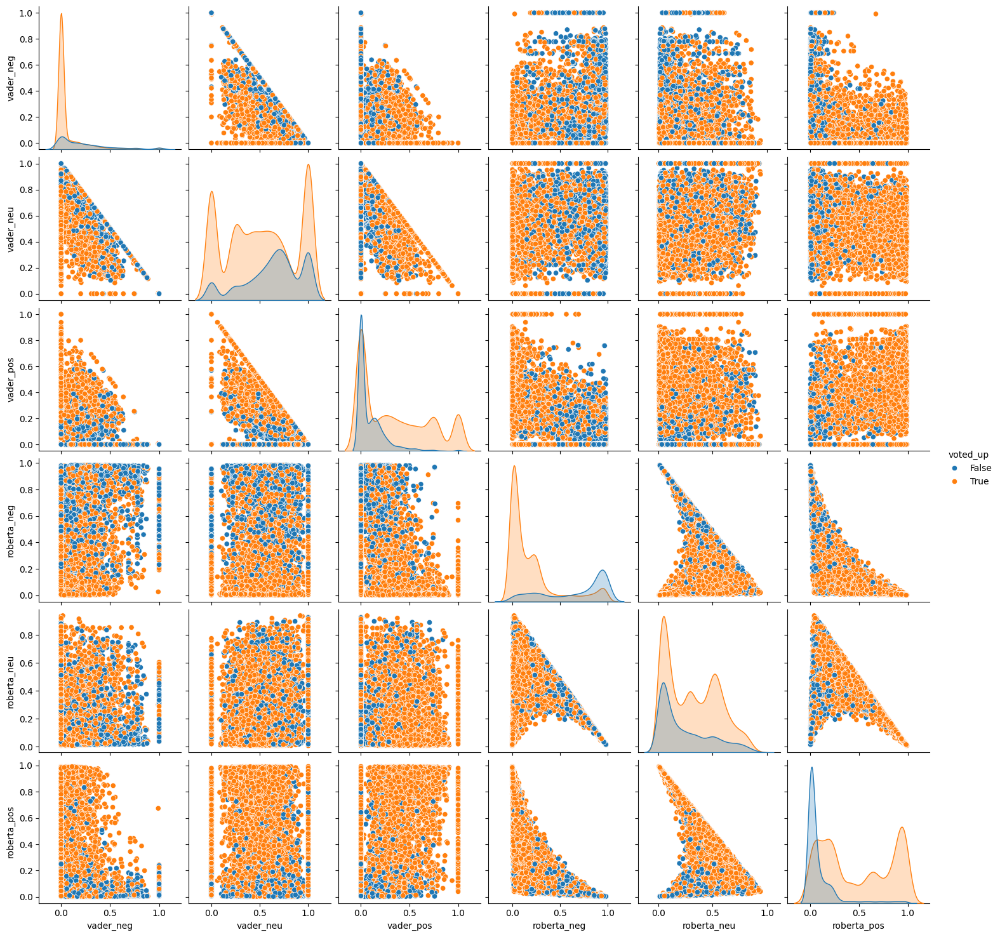

In [45]:
sns.pairplot(data = total_score_s18, vars = ['vader_neg','vader_neu','vader_pos',
                                            'roberta_neg','roberta_neu','roberta_pos'],
             hue = "voted_up", palette = "tab10")
plt.show()


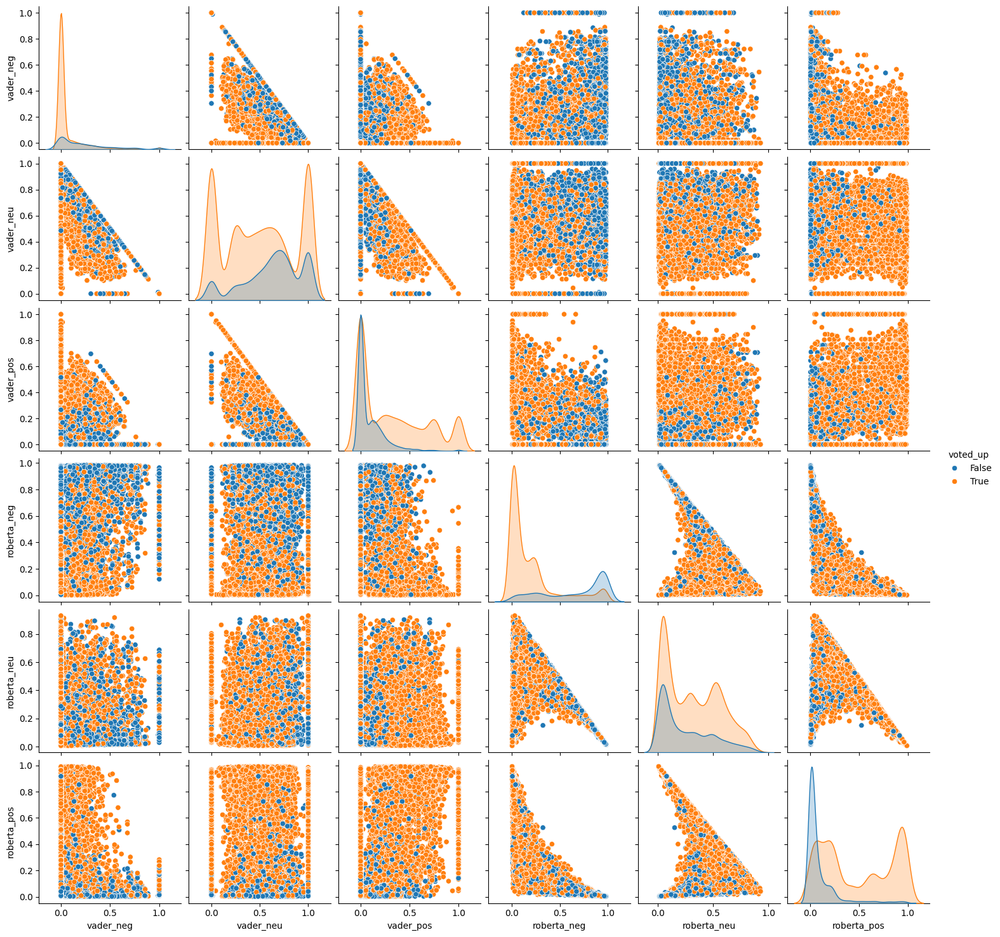

In [46]:
sns.pairplot(data = total_score_s19, vars = ['vader_neg','vader_neu','vader_pos',
                                            'roberta_neg','roberta_neu','roberta_pos'],
             hue = "voted_up", palette = "tab10")
plt.show()


# Ranking Seasons


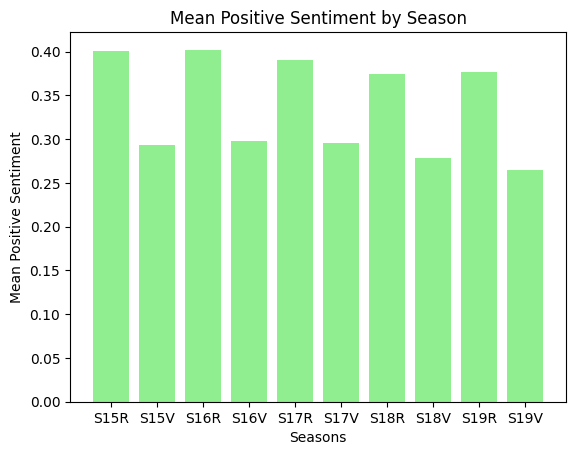

In [68]:
mean_pos_values = [
    total_score_s15["roberta_pos"].mean(),
    total_score_s15["vader_pos"].mean(),
    total_score_s16["roberta_pos"].mean(),
    total_score_s16["vader_pos"].mean(),
    total_score_s17["roberta_pos"].mean(),
    total_score_s17["vader_pos"].mean(),
    total_score_s18["roberta_pos"].mean(),
    total_score_s18["vader_pos"].mean(),
    total_score_s19["roberta_pos"].mean(),
    total_score_s19["vader_pos"].mean()]
catagories = ["S15R", "S15V", "S16R", "S16V", "S17R", "S17V", "S18R", "S18V", "S19R", "S19V"]
plt.bar(catagories,mean_pos_values, color = 'lightgreen')

plt.xlabel('Seasons')
plt.ylabel('Mean Positive Sentiment')
plt.title('Mean Positive Sentiment by Season')

plt.show()


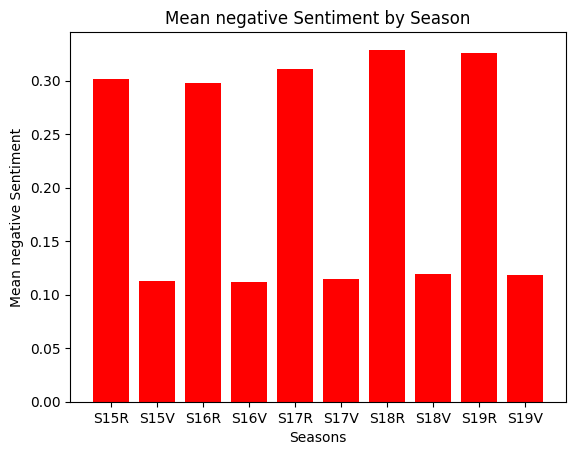

In [64]:
mean_neg_values = [
    total_score_s15["roberta_neg"].mean(),
    total_score_s15["vader_neg"].mean(),
    total_score_s16["roberta_neg"].mean(),
    total_score_s16["vader_neg"].mean(),
    total_score_s17["roberta_neg"].mean(),
    total_score_s17["vader_neg"].mean(),
    total_score_s18["roberta_neg"].mean(),
    total_score_s18["vader_neg"].mean(),
    total_score_s19["roberta_neg"].mean(),
    total_score_s19["vader_neg"].mean()]
catagories = ["S15R", "S15V", "S16R", "S16V", "S17R", "S17V", "S18R", "S18V", "S19R", "S19V"]
plt.bar(catagories,mean_neg_values, color = 'red')

plt.xlabel('Seasons')
plt.ylabel('Mean negative Sentiment')
plt.title('Mean negative Sentiment by Season')

plt.show()

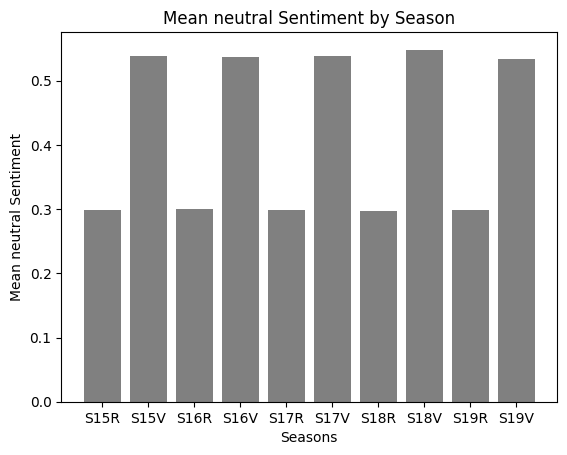

In [66]:
mean_neu_values = [
    total_score_s15["roberta_neu"].mean(),
    total_score_s15["vader_neu"].mean(),
    total_score_s16["roberta_neu"].mean(),
    total_score_s16["vader_neu"].mean(),
    total_score_s17["roberta_neu"].mean(),
    total_score_s17["vader_neu"].mean(),
    total_score_s18["roberta_neu"].mean(),
    total_score_s18["vader_neu"].mean(),
    total_score_s19["roberta_neu"].mean(),
    total_score_s19["vader_neu"].mean()]
catagories = ["S15R", "S15V", "S16R", "S16V", "S17R", "S17V", "S18R", "S18V", "S19R", "S19V"]
plt.bar(catagories,mean_neu_values, color = 'grey')

plt.xlabel('Seasons')
plt.ylabel('Mean neutral Sentiment')
plt.title('Mean neutral Sentiment by Season')

plt.show()

# Further Analysis

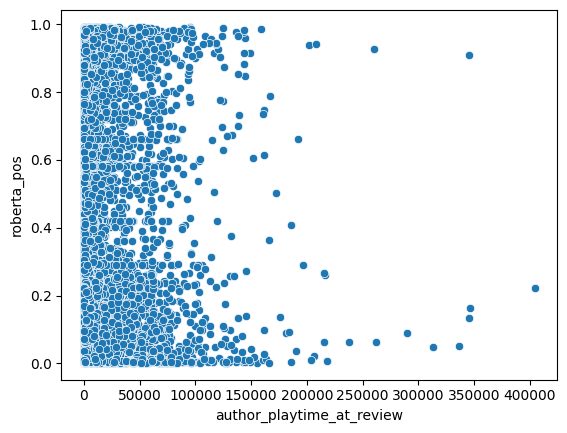

In [47]:
sns.scatterplot(data = total_score_s15 , y = "roberta_pos", x = "author_playtime_at_review")
plt.show()

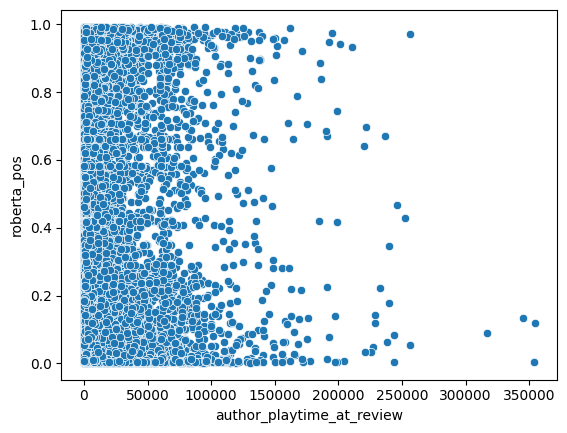

In [48]:
sns.scatterplot(data = total_score_s16 , y = "roberta_pos", x = "author_playtime_at_review")
plt.show()

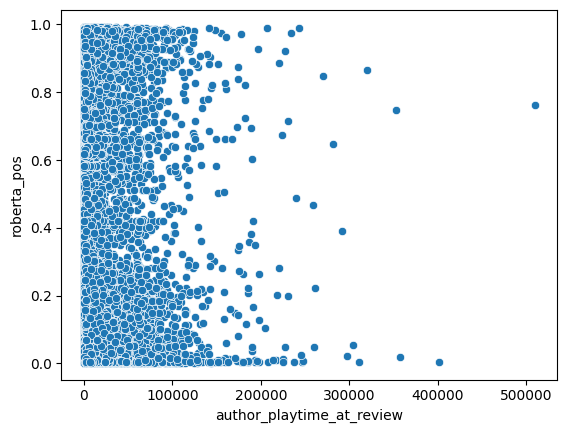

In [51]:
sns.scatterplot(data = total_score_s17 , y = "roberta_pos", x = "author_playtime_at_review")
plt.show()

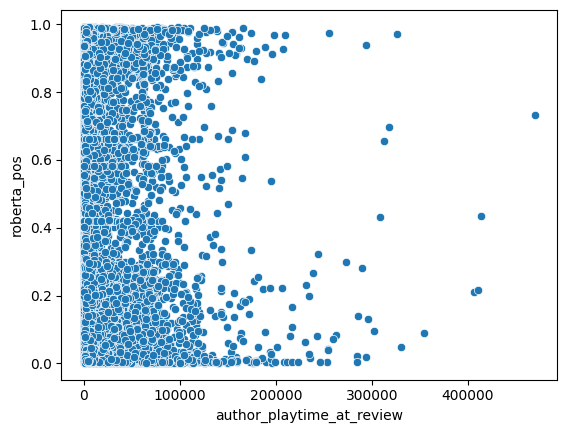

In [50]:
sns.scatterplot(data = total_score_s18 , y = "roberta_pos", x = "author_playtime_at_review")
plt.show()

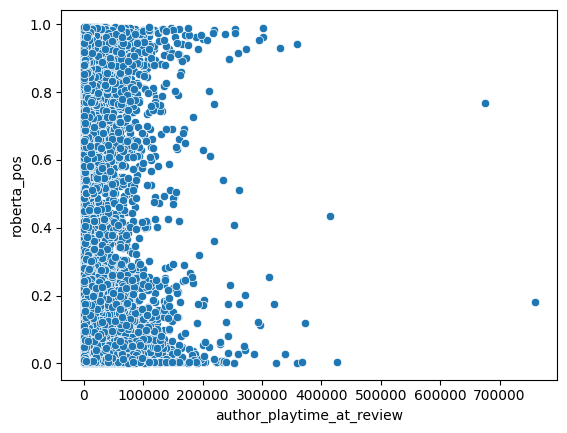

In [49]:
sns.scatterplot(data = total_score_s19 , y = "roberta_pos", x = "author_playtime_at_review")
plt.show()